In [1]:
import pandas as pd
import numpy as np
import os

pd.set_option('max_columns', 100)

from plotter import *


In [2]:
train2021 = pd.read_csv('./data_norm2/week16_norm.csv')
seavskc = train2021.query('displayName == "Russell Wilson"').groupby(['playId'], as_index=False).first()
seavskc.head()

,playId,time,x,y,s,a,dis,o,dir,event,nflId,displayName,jerseyNumber,position,frameId,team,gameId,playDirection,route,los,los_norm,x_norm,y_norm
0,255,2018-12-24T01:28:51.200Z,76.83,23.50,0.00,0.00,0.00,260.13,139.51,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,73.32,40,36.49,29.80
1,277,2018-12-24T01:29:29.500Z,77.21,23.42,0.03,0.03,0.02,260.70,219.67,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,74.00,40,36.79,29.88
2,775,2018-12-24T01:49:24.299Z,83.02,23.53,0.01,0.01,0.01,263.75,299.73,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,79.80,40,36.78,29.77
3,800,2018-12-24T01:49:56.000Z,70.53,29.67,0.10,0.07,0.01,252.84,337.50,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,69.29,40,38.76,23.63
4,833,2018-12-24T01:50:48.000Z,44.51,23.62,0.01,0.01,0.00,237.91,10.76,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,44.10,40,39.59,29.68


In [3]:
plays = list(seavskc[['gameId', 'playId']].to_records(index=False))

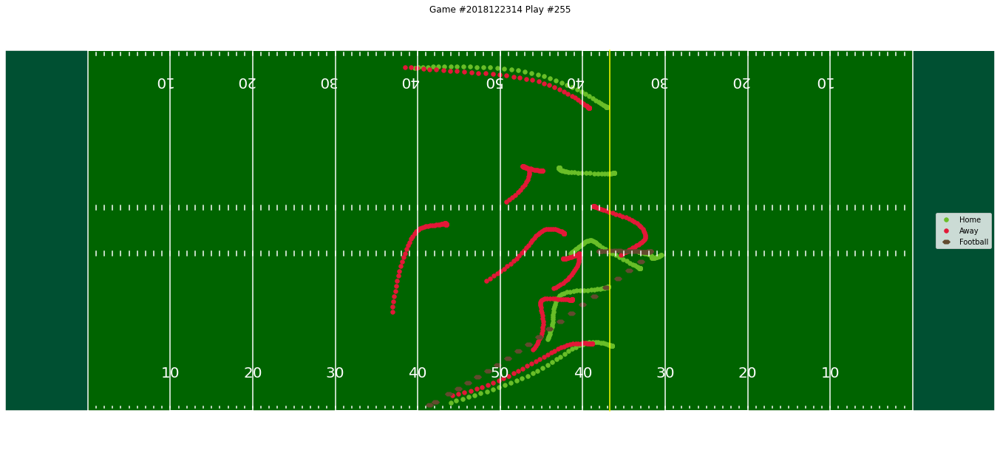

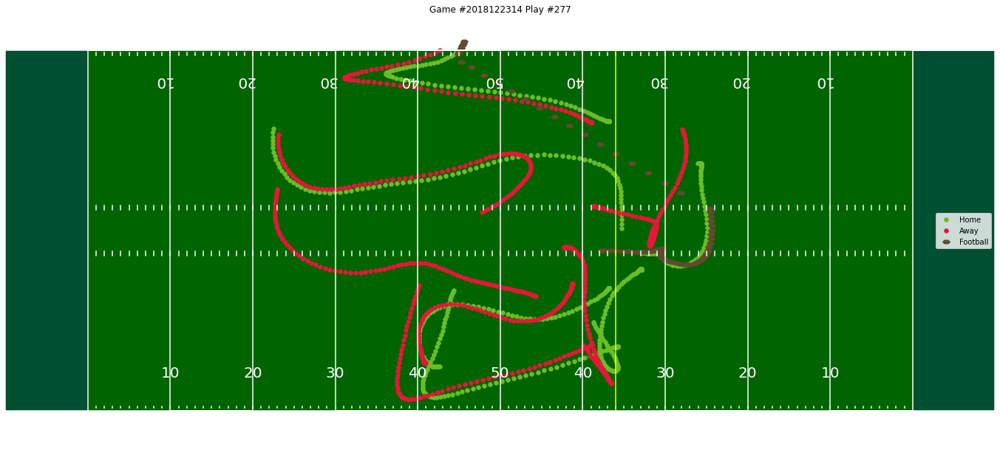

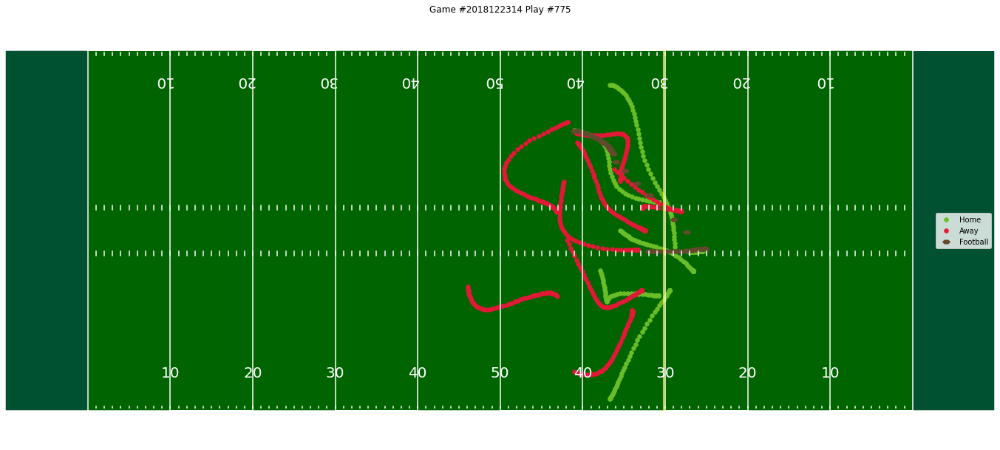

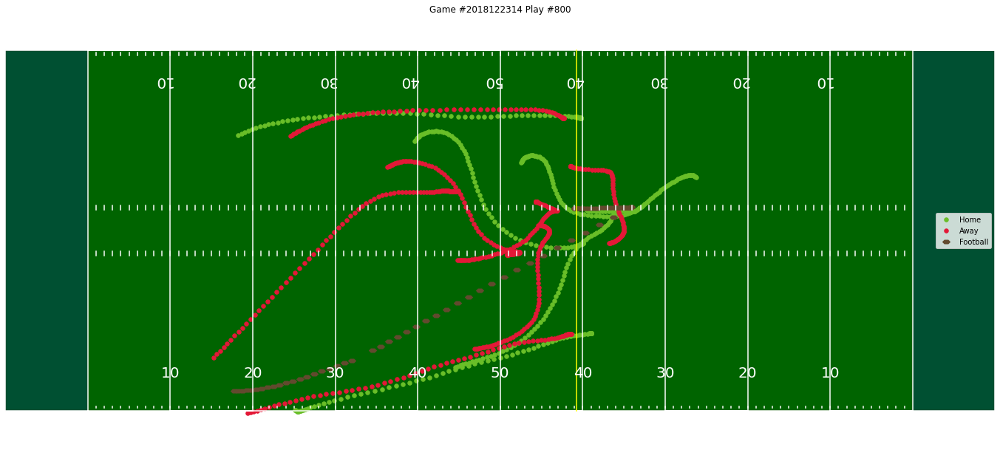

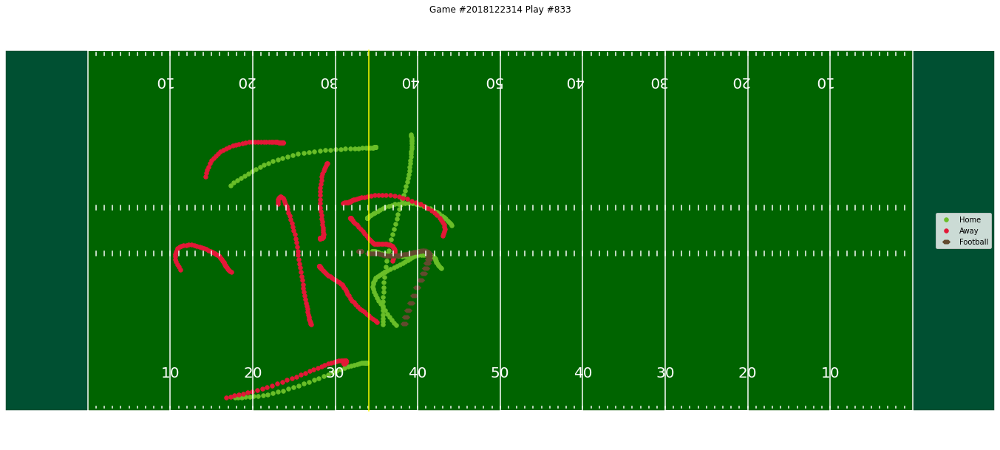

...

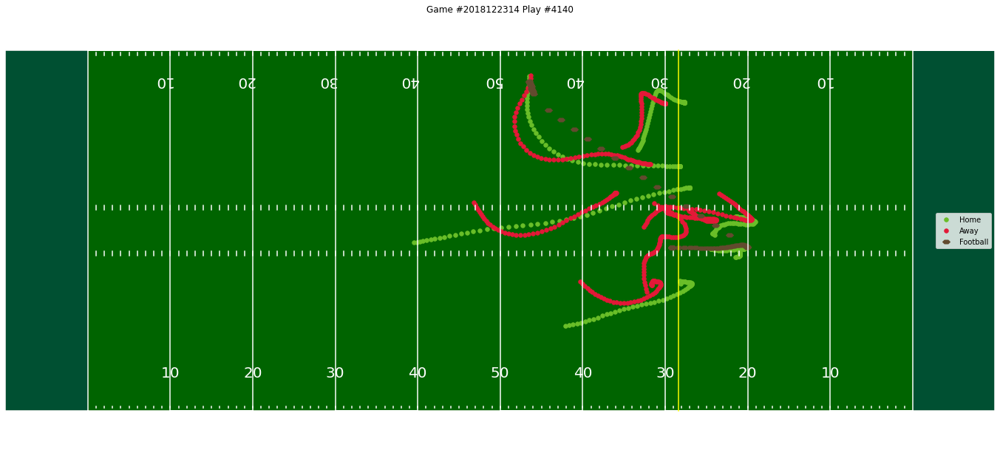

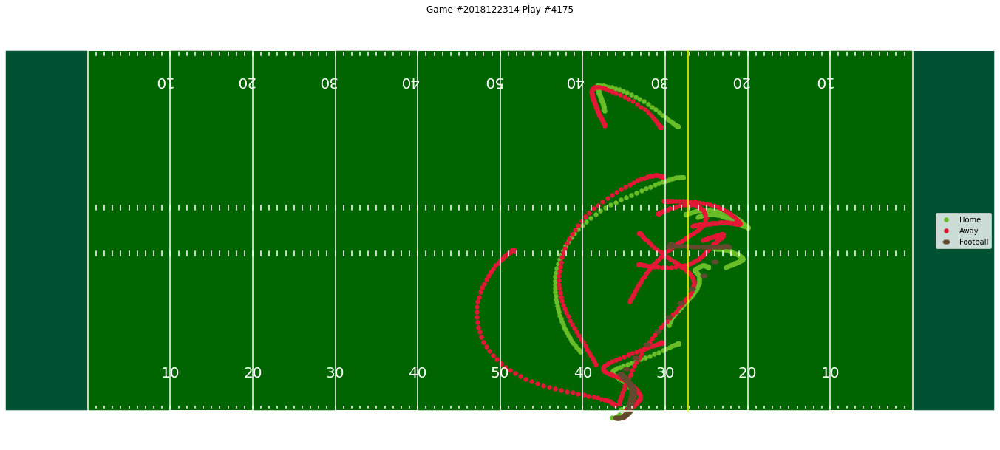

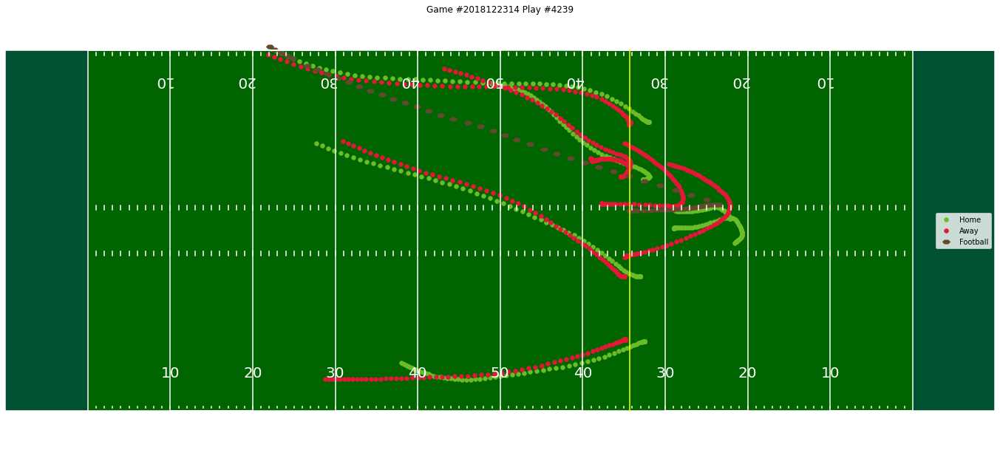

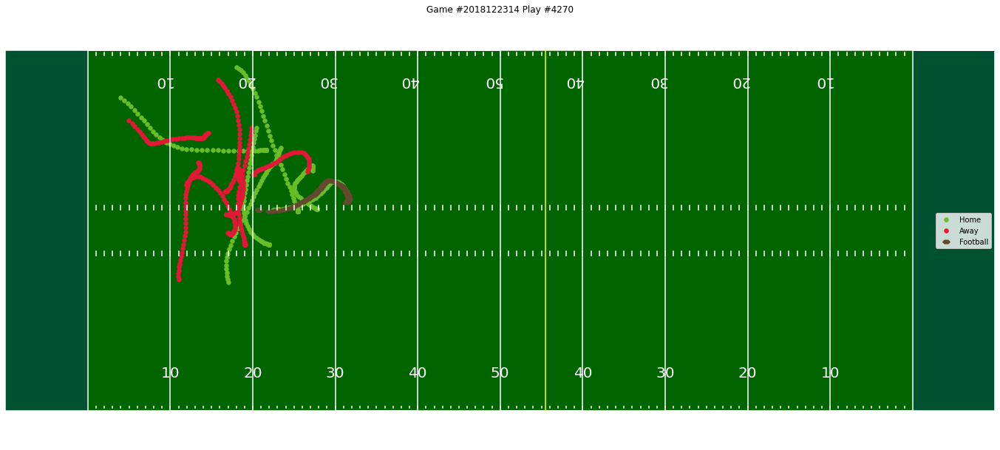

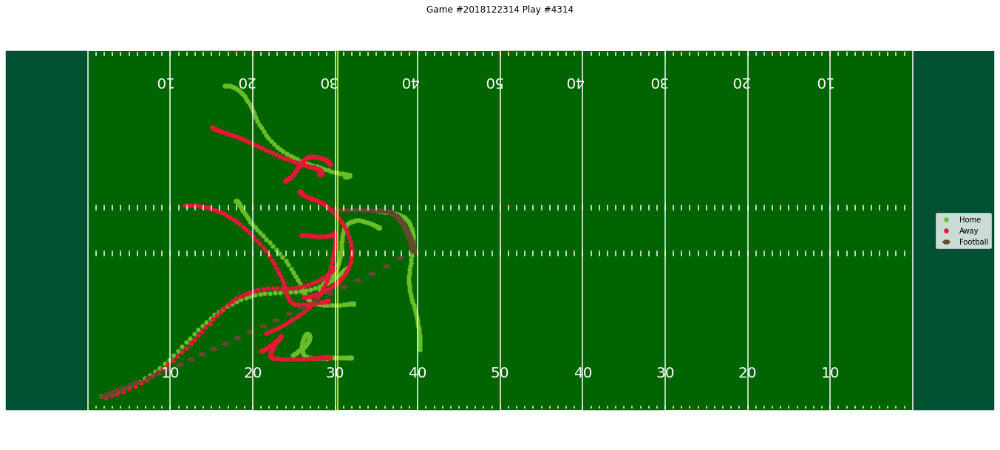

In [5]:

for ex_game_id, ex_play_id in plays[:]:
    example_play_home = train2021.query('gameId == @ex_game_id and playId == @ex_play_id and team == "home"')
    example_play_away = train2021.query('gameId == @ex_game_id and playId == @ex_play_id and team == "away"')
    example_play_football = train2021.query('gameId == @ex_game_id and playId == @ex_play_id and team == "football"')

    yl = train2021.query("playId == @ex_play_id")['los'].tolist()[0]
    fig, ax = create_football_field(highlight_line=True,
                                    highlight_line_x=yl,
                                    figscale=0.2)
    example_play_home.plot(x='x', y='y', kind='scatter', ax=ax, color='#69BE28', s=30, label='Home')
    example_play_away.plot(x='x', y='y', kind='scatter', ax=ax, color='#E31837', s=30, label='Away')
    example_play_football.plot(x='x', y='y', kind='scatter', ax=ax, color='#624a2e', s=100, label='Football', marker=ballPath)
    plt.title(f'Game #{ex_game_id} Play #{ex_play_id}')
    plt.legend()
    plt.show()


In [ ]:
yl = train2021.query("playId == @ex_play_id")['los_norm'].tolist()[0]
fig, ax = create_football_field(highlight_line=True,
                                highlight_line_x=yl)
example_play_home.plot(x='x_norm', y='y_norm', kind='scatter', ax=ax, color='orange', s=30, label='Away')
example_play_away.plot(x='x_norm', y='y_norm', kind='scatter', ax=ax, color='blue', s=30, label='Home')
example_play_football.plot(x='x_norm', y='y_norm', kind='scatter', ax=ax, color='black', s=20, label='Football')
plt.title(f'Normalized: Game #{ex_game_id} Play #{ex_play_id}')
plt.legend()
plt.show()